In [71]:
import prepare_data
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import scipy.spatial as spatial
import networkx as nx
from networkx.algorithms.components.connected import connected_components
import datetime

In [72]:
def format_date(date):
    """
    From yyyy-mm-dd to dd.mm.yyyy
    """
    d = datetime.datetime.strptime(date, '%Y-%m-%d')
    return d.strftime('%d.%m.%Y')

<h1>LOKACIJE ČEBELNJAKOV</h1>

In [62]:
file_name = "dataset-1/cebelnjaki-lokacija.csv"
cleaned_file_name = prepare_data.clean_csv_data(file_name)
df_lokacije = pd.read_csv(cleaned_file_name, index_col=None)
X_lokacije, Y_lokacije = prepare_data.clean_and_get_coordinates(df_lokacije, ["X", "Y"], reverse=True)


<h1>LOKACIJE STOJIŠČ</h1>

In [58]:
file_name = "dataset-1/stojisca-lokacija.csv"
cleaned_file_name = prepare_data.clean_csv_data(file_name, min_cols=4)
df_stojisca = pd.read_csv(cleaned_file_name, index_col=None)

# Convert to date
df_stojisca['DAT_ZACETEK'] = pd.to_datetime(df_stojisca['DAT_ZACETEK'], format='%y.%m.%d')
df_stojisca['DAT_PRENEHANJE'] = pd.to_datetime(df_stojisca['DAT_PRENEHANJE'], format='%y.%m.%d')

use_filter = True

if use_filter:
    # Filter by date
    date_from = "1800-01-01"
    date_to = None  # None for currenty active
    if date_to is None:
        df_stojisca_date_filtered = df_stojisca.loc[(df_stojisca['DAT_ZACETEK'] >= date_from) & pd.isnull(df_stojisca['DAT_PRENEHANJE'])]
    else:
        df_stojisca_date_filtered = df_stojisca.loc[(df_stojisca['DAT_ZACETEK'] >= date_from) & (df_stojisca['DAT_PRENEHANJE'] <= date_to)]
    df_stojisca = df_stojisca_date_filtered

X_stojisca, Y_stojisca = prepare_data.clean_and_get_coordinates(df_stojisca, ["X", "Y"], reverse=True)


<h1>LOKACIJE VZREJALIŠČ ČEBELJIH MATIC</h1>

In [4]:
file_name = "dataset-1/vzrejalisca_cebeljih_matic.csv"
cleaned_file_name = prepare_data.clean_csv_data(file_name, min_cols=3)
df_matice = pd.read_csv(cleaned_file_name, index_col=None)
X_matice, Y_matice = prepare_data.clean_and_get_coordinates(df_matice, ["X", "Y"], reverse=True)


<h1>LOKACIJE IZBRUHOV GNILOBE</h1>

In [74]:
file_name = "dataset-1/hgczi-lokacija.csv"
cleaned_file_name = prepare_data.clean_csv_data(file_name, min_cols=4)
df_gniloba = pd.read_csv(cleaned_file_name, index_col=None)

# Convert columns in dataframe to date type
df_gniloba['DAT_ZACETEK'] = pd.to_datetime(df_gniloba['DAT_ZACETEK'], format='%d.%m.%y')
df_gniloba['DAT_PRENEHANJE'] = pd.to_datetime(df_gniloba['DAT_PRENEHANJE'], format='%d.%m.%y')

use_filter = True

if use_filter:
    ### Filtriraj po obdobju, ko je bila gniloba aktivna
    date_from = "2020-01-01"  # Od kdaj naprej je bil začetek izbruha gnilobe
    date_to = "2020-12-31"  # Do kdaj je bil konec izbruha gnilobe (None, da je še aktivno)

    if date_to is None:
        df_gniloba_date_filtered = df_gniloba.loc[(df_gniloba['DAT_ZACETEK'] >= date_from) & pd.isnull(df_gniloba['DAT_PRENEHANJE'])]
    else:
        df_gniloba_date_filtered = df_gniloba.loc[(df_gniloba['DAT_ZACETEK'] >= date_from) & (df_gniloba['DAT_PRENEHANJE'] <= date_to)]

    ### Filtriraj in prikaži samo čebelnjake z aktivno gnilobo
    df_gniloba_active = df_gniloba.loc[pd.isnull(df_gniloba['DAT_PRENEHANJE'])]

    # df_gniloba = df_gniloba_date_filtered
    df_gniloba = df_gniloba_active

df_gniloba = prepare_data.clean_and_get_coordinates(df_gniloba, ["X", "Y"], reverse=True, return_df=True)  # remove rows with invalid data
X_gniloba, Y_gniloba = prepare_data.clean_and_get_coordinates(df_gniloba, ["X", "Y"], reverse=True)

start_gniloba = [df_gniloba["DAT_ZACETEK"][key] for key in df_gniloba["DAT_ZACETEK"].keys()]
end_gniloba = [df_gniloba["DAT_PRENEHANJE"][key] for key in df_gniloba["DAT_PRENEHANJE"].keys()]

<h1>PREMIKI</h1>

In [151]:
file_name = "dataset-1/premiki_cebeljih_druzin.csv"
cleaned_file_name = prepare_data.clean_csv_data(file_name)
df_premiki = pd.read_csv(cleaned_file_name, index_col=None)

# Convert columns in dataframe to date type
df_premiki['DATE_MOVE'] = pd.to_datetime(df_premiki['DATE_MOVE'], format='%d.%m.%y')

use_filter = True

if use_filter:
    ### Filter by date range
    movement_date_from = "2020-01-01"
    movement_date_to = "2020-12-31"
    df_premiki_date_filtered = df_premiki.loc[(df_premiki['DATE_MOVE'] >= movement_date_from) & (df_premiki['DATE_MOVE'] <= movement_date_to)]

    ### Filter all that were in given month (example: 3 = march)
    df_premiki_month_filtered = df_premiki.loc[(df_premiki['DATE_MOVE'].dt.month == 6)]

    ### Filter all from given coordinates
    x_from = X_lokacije[4509]
    y_from = Y_lokacije[4509]
    df_premiki_lokacija_iz_filtered = df_premiki.loc[(df_premiki['X'] == x_from) & (df_premiki['Y'] == y_from)]

    ### Izberi kateri tip filtra bi rad uporabil
    df_premiki = df_premiki_date_filtered
    # df_premiki = df_premiki_month_filtered
    # df_premiki = df_premiki_lokacija_iz_filtered

df_premiki_cleaned1 = prepare_data.clean_and_get_coordinates(df_premiki, ["X", "Y"], return_df=True)
df_premiki_cleaned2 = prepare_data.clean_and_get_coordinates(df_premiki_cleaned1, ["X_DEST", "Y_DEST"], return_df=True)

X1_premiki, Y1_premiki = prepare_data.clean_and_get_coordinates(df_premiki_cleaned2, ["X", "Y"], reverse=True)
X2_premiki, Y2_premiki = prepare_data.clean_and_get_coordinates(df_premiki_cleaned2, ["X_DEST", "Y_DEST"], reverse=True)

premiki_date = [df_premiki_cleaned2["DATE_MOVE"][key] for key in df_premiki_cleaned2["DATE_MOVE"].keys()]

<h1>GRUČANJE ČEBELNJAKOV</h1>

In [94]:
max_distance = 2500  # meters

points = np.array([(X_lokacije[i], Y_lokacije[i]) for i in range(len(X_lokacije))])
point_tree = spatial.cKDTree(points)
connected_points = []
for index, point in enumerate(points):
    indices_of_points_within_radius = point_tree.query_ball_point(point, max_distance)
    connected_points.append(indices_of_points_within_radius)

def to_graph(clusters):
    G = nx.Graph()
    for cluster in clusters:
        G.add_nodes_from(cluster)
        G.add_edges_from(to_edges(cluster))
    return G

def to_edges(l):
    """ 
        treat `l` as a Graph and returns it's edges 
        to_edges(['a','b','c','d']) -> [(a,b), (b,c),(c,d)]
    """
    it = iter(l)
    last = next(it)
    for current in it:
        yield last, current
        last = current    

G = to_graph(connected_points)
# seznam clusterjev, v vskem clusterju so id_ji panjev, ki so v njem (lokacija v liste X_lokacije, Y_lokacije)
clusters = [list(cluster) for cluster in connected_components(G)]


<h1>IZVOZ PODATKOV V JSON</h1>

In [51]:
izvozi_podatke_v_json = False
folder_name = "generated_data"

<h4>Lokacije čebelnjakov</h4>

In [52]:
if izvozi_podatke_v_json:
    # transformiraj koordinate čebelnjakov in jih shrani
    data = []
    for index, (xs, ys) in enumerate(zip(X_lokacije, Y_lokacije)):
        lon, lat = prepare_data.convert_coordinates(xs, ys, reverse_coords=False)
        # Get id of cluster in which it is. If it's alone in cluster, set its id to 0
        cluster_indices = []
        i = 1
        for cluster in clusters:
            if len(cluster) > 1:
                cluster_indices.append(i)
                i += 1
            else:
                cluster_indices.append(0)
        cluster_id = cluster_indices[[list(cluster).count(index) for cluster in clusters].index(1)]
        data.append({
            "id": index,
            "lon": lon,
            "lat": lat,
            "cluster_id": cluster_id,
            "owner_id": 0,
        })

    with open(f'{folder_name}/beehive.json', 'w') as f:
        json.dump(data, f)

<h4>Lokacije stojišč</h4>

In [59]:
if izvozi_podatke_v_json:
    # transformiraj koordinate stojisc in jih shrani
    data = []
    for index, (xs, ys) in enumerate(zip(X_stojisca, Y_stojisca)):
        lon, lat = prepare_data.convert_coordinates(xs, ys, reverse_coords=False)
        data.append({
            "id": index,
            "lon": lon,
            "lat": lat,
            "occupancy": np.random.rand(),
        })

    with open(f'{folder_name}/beestand.json', 'w') as f:
        json.dump(data, f)

<h4>Lokacije vzrejališč matic</h4>

In [54]:
if izvozi_podatke_v_json:
    # transformiraj koordinate vzrejalisc matic in jih shrani
    data = []
    for index, (xs, ys) in enumerate(zip(X_matice, Y_matice)):
        lon, lat = prepare_data.convert_coordinates(xs, ys, reverse_coords=False)
        data.append({
            "id": index,
            "lon": lon,
            "lat": lat,
        })

    with open(f'{folder_name}/breeding.json', 'w') as f:
        json.dump(data, f)

<h4>Gniloba</h4>

In [55]:
if izvozi_podatke_v_json:
    # transformiraj koordinate vzrejalisc matic in jih shrani
    data = []
    for index, (xs, ys) in enumerate(zip(X_gniloba, Y_gniloba)):
        lon, lat = prepare_data.convert_coordinates(xs, ys, reverse_coords=False)
        data.append({
            "id": index,
            "lon": lon,
            "lat": lat,
            "radius": max_distance,
            "start_date": str(start_gniloba[index].date()),
            "end_date": str(end_gniloba[index].date()),
            "is_active":  pd.isnull(end_gniloba[index]),
        })

    with open(f'{folder_name}/disease.json', 'w') as f:
        json.dump(data, f)

<h4>Premiki</h4>

In [56]:
if izvozi_podatke_v_json:
    # transformiraj koordinate vzrejalisc matic in jih shrani
    data = []
    for index, (xs, ys) in enumerate(zip(X1_premiki, Y1_premiki)):
        lon, lat = prepare_data.convert_coordinates(xs, ys, reverse_coords=False)
        x2, y2 = X2_premiki[index], Y2_premiki[index]
        lon2, lat2 = prepare_data.convert_coordinates(x2, y2, reverse_coords=False)
        data.append({
            "id": index,
            "start_lon": lon,
            "start_lat": lat,
            "end_lon": lon2,
            "end_lat": lat2,
            "date": str(premiki_date[index].date()),
        })

    with open(f'{folder_name}/movement.json', 'w') as f:
        json.dump(data, f)

<h1>Vizualizacija</h1>

<h3>Lokacije</h3>

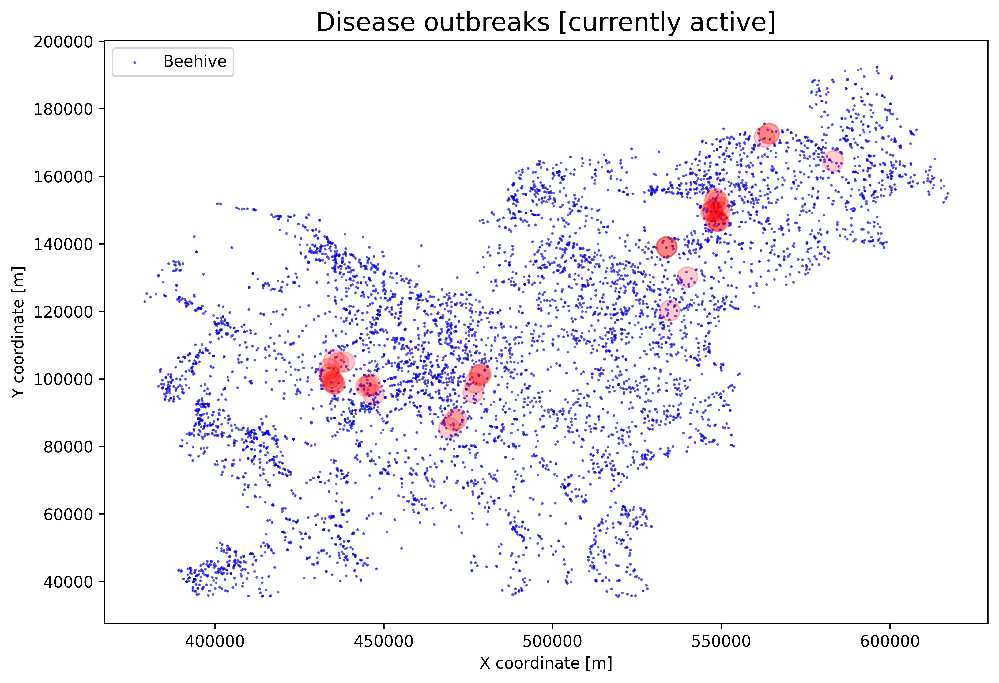

In [75]:
size = 0.5
alpha = 0.6
radius_gniloba = 3000  # meters
alpha_gniloba = 0.2

plt.figure(figsize=(10, 10), dpi=600)
ax = plt.axes()
ax.set_aspect("equal")
plt.scatter(X_lokacije, Y_lokacije, s=size, c="blue", alpha=alpha, label="Beehive")
# plt.scatter(X_stojisca, Y_stojisca, s=size, c="green", alpha=alpha, label="Apiary stand")
# plt.scatter(X_matice, Y_matice, s=10*size, c="orange", alpha=alpha, label="Queen breeding farm")

### Nariši okužbe
for x_, y_ in zip(X_gniloba, Y_gniloba):
    circle = plt.Circle((x_, y_), radius_gniloba, color="red", linestyle="-", alpha=alpha_gniloba)
    ax.add_patch(circle)

# plt.title("Lokacije čebelnjakov, stojišč in vzrejališč čebeljih matic", fontsize=16)
# plt.title("Locations of beehives", fontsize=16)
plt.title(f"Disease outbreaks [currently active]", fontsize=16)
# plt.title(f"Disease outbreaks [{format_date(date_from)} - {format_date(date_to)}]", fontsize=16)
plt.xlabel("X coordinate [m]")
plt.ylabel("Y coordinate [m]")
plt.legend()
plt.show()

<h3>Gručanje</h3>

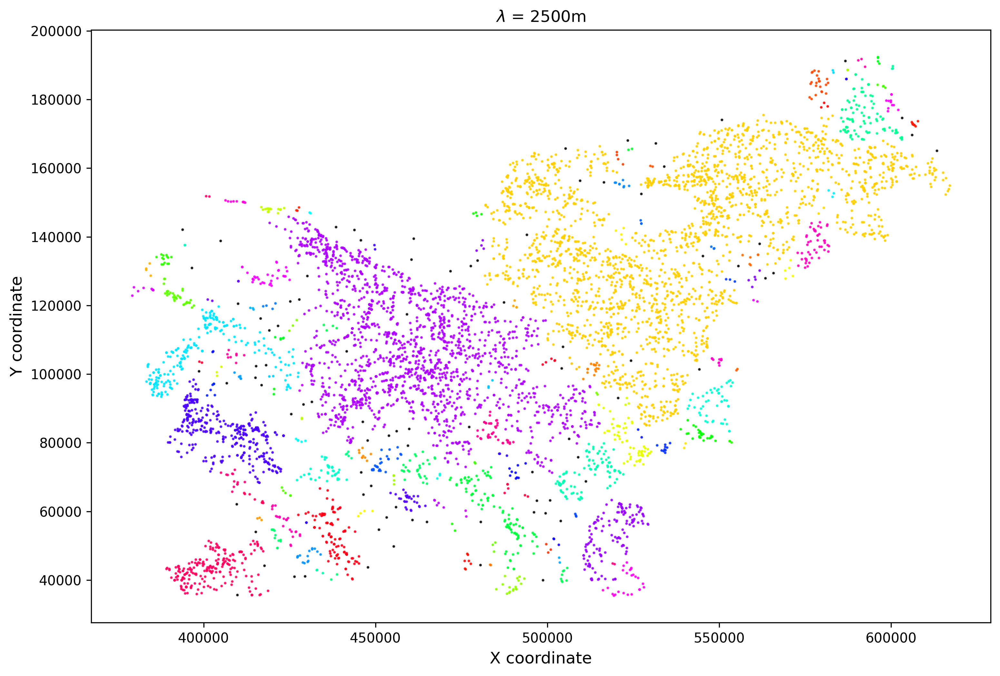

In [101]:
size = 1.0
alpha = 0.8
radius_gniloba = 3000  # meters
alpha_gniloba = 0.2


# Number of clusters in labels, ignoring noise if present.
n_clusters = len(clusters)
n_noise = [len(cluster) for cluster in clusters].count(1)
n_groups = n_clusters - n_noise  # število clusterjev, v katerih je več kot en element
labels = list(range(1, n_groups+1))
colors = [plt.cm.hsv(each) for each in np.linspace(0, 1, n_groups)]
np.random.shuffle(colors)

plt.figure(figsize=(12, 12), dpi=300)
ax = plt.axes()
ax.set_aspect("equal")

i = 0
for index, cluster in enumerate(clusters):
    if len(cluster) <= 1:
        # Black used for single element clusters.
        col = [0, 0, 0, 1]
        label = None
    else:
        col = colors[i]
        label = labels[i]
        i += 1
    xs = [X_lokacije[point_index] for point_index in cluster]
    ys = [Y_lokacije[point_index] for point_index in cluster]
    
    ### Nariši črte med točkami
    # plt.plot(xs, ys, color=tuple(col), linewidth=0.2)
    
    ### Nariši točke
    plt.scatter(xs, ys, color=tuple(col), s=size, alpha=alpha, label=[f"{label} ({len(cluster)})" if label is not None else None][0])

    ### Nariši kroge okoli točk, do kod se lahko še bolezen širi
#     for ii, (x_, y_) in enumerate(zip(xs, ys)):
#         circle = plt.Circle((x_, y_), max_distance, color=col, linestyle="-", linewidth=1, fill=None)
#         ax.add_patch(circle)
    
    ### Dopiši id-je točk na grafu
    # plt.text(x_, y_, f"{list(cluster)[ii]}")

### Nariši trenutne okužbe
# for x_, y_ in zip(X_gniloba, Y_gniloba):
#     circle = plt.Circle((x_, y_), radius_gniloba, color="red", linestyle="-", alpha=alpha_gniloba)
#     ax.add_patch(circle)
        
# plt.title(f'Number of clusters: {n_groups} \nNumber of individual points: {n_noise} \nMax distance: {max_distance}m')
lambda_ = r'$\lambda$'
plt.title(f"{lambda_} = {max_distance}m")
plt.xlabel("X coordinate", fontsize=12)
plt.ylabel("Y coordinate", fontsize=12)

# plt.xticks([])
# plt.yticks([])
# plt.xlim(475000, 500000)
# plt.ylim(40000, 70000)

# plt.legend(title="Group number:")
plt.show()

<h3>Premiki</h3>

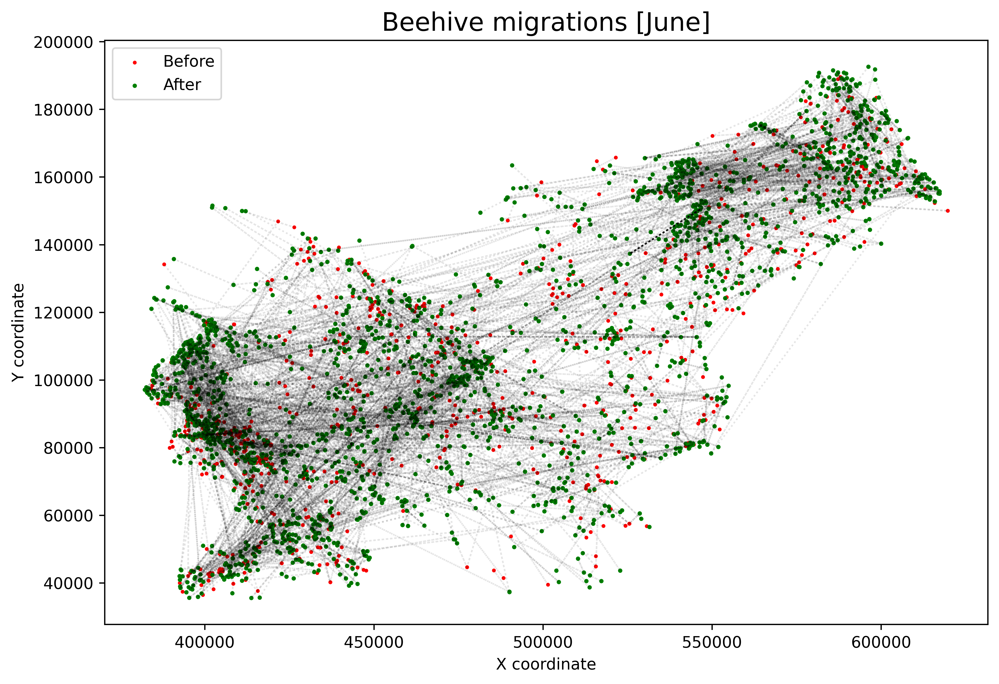

In [152]:
arrow_alpha = 0.1
arrow_width = 0.01

def drawArrow(A, B):
    plt.arrow(A[0], A[1], B[0] - A[0], B[1] - A[1], length_includes_head=True, width=arrow_width, linestyle=":", alpha=arrow_alpha)

plt.figure(figsize=(10, 10), dpi=600)
ax = plt.axes()
ax.set_aspect("equal")

for i in range(len(X1_premiki)):
    drawArrow([X1_premiki[i], Y1_premiki[i]], [X2_premiki[i], Y2_premiki[i]])

plt.scatter(X1_premiki, Y1_premiki, s=2, c="red", label="Before")
plt.scatter(X2_premiki, Y2_premiki, s=3, c="green", label="After")
    
plt.title(f"Beehive migrations [June]", fontsize=16)
# plt.title(f"Beehive migrations [{format_date(movement_date_from)} - {format_date(movement_date_to)}]", fontsize=16)

plt.xlabel("X coordinate")
plt.ylabel("Y coordinate")
plt.legend(loc="upper left")
plt.show()